In [1]:
using Pkg
Pkg.activate("../")
Pkg.status()

  Activating environment at `~/WORK/HPL/Code/ina-julia/Project.toml`


      Status `~/WORK/HPL/Code/ina-julia/Project.toml`
  [6e4b80f9] BenchmarkTools v1.1.4
  [a134a8b2] BlackBoxOptim v0.6.0
  [336ed68f] CSV v0.9.0
  [a93c6f00] DataFrames v1.2.2
  [0c46a032] DifferentialEquations v6.18.0
  [587475ba] Flux v0.12.6
  [a75be94c] GalacticOptim v2.0.3
  [7073ff75] IJulia v1.23.2
  [429524aa] Optim v1.4.1
  [91a5bcdd] Plots v1.21.3
  [c3572dad] Sundials v4.5.3


# Load packages

In [2]:
using DifferentialEquations
using Sundials
using DataFrames: DataFrame
using CSV: File as CSVFile

using Plots
using BenchmarkTools

using Parameters
using Setfield

┌ Warning: Replacing module `NLsolve`
└ @ Base loading.jl:959


# Load CSV

In [3]:
dirname_data = "../data"
dirname_legends = joinpath(dirname_data, "legends")
dirname_protocols = joinpath(dirname_data, "protocols")

filename_legend_constants = joinpath(dirname_legends, "legend_constants_v2.csv")
filename_legend_states = joinpath(dirname_legends, "legend_states.csv")
filename_protocol = joinpath(dirname_protocols, "protocol_sparse.csv");

In [4]:
read_csv(filename) = DataFrame(CSVFile(filename))

read_csv (generic function with 1 method)

In [5]:
legend_states = read_csv(filename_legend_states)
legend_constants = read_csv(filename_legend_constants)
protocol = read_csv(filename_protocol);

In [6]:
find_step(t, protocol) = protocol.v[findfirst(x -> x >= t, protocol.t)]

function create_p_from_legend(legend)
    name = Symbol.(legend_constants.name)
    value = legend_constants.value
    p = (; zip(name, value)...)
end

create_p_from_legend (generic function with 1 method)

# Load equations

In [9]:
include("../src/models/ina.jl");
include("../src/models/currents_v_c.jl");

# Define model

Now `v_c` is the state guy

In [35]:
function compute_algebraic(du, u, p, t)
    
    v_comp, v_p, v_m, m, h, j, I_out, v_c_state = u
        
    tau_m  = calculate_tau_m(v_m, p)
    tau_h  = calculate_tau_h(v_m, p)
    tau_j  = calculate_tau_j(v_m, p)
    
    m_inf  = calculate_m_inf(v_m, p)
    h_inf  = calculate_h_inf(v_m, p)
    
    v_cp   = calculate_v_cp(v_c_state, v_comp, p)

    I_leak = 0 # calculate_I_leak(v_m, p)
    I_Na   = calculate_I_Na(v_m, m, h, j, p)
    I_c    = 0 # calculate_I_c(v_m, v_cp, I_leak, I_Na,  p)  # or calculate_I_c(v_m, v_p, I_leak, I_Na,  p)
    I_p    = 0  # or calculate_I_p(v_cp, v_p, p)
    I_comp = 0 # calculate_I_comp(v_comp, p)
    
    I_in   = I_Na + I_leak + I_Na + I_c - I_comp + I_p
    
    a = (;
     tau_m, tau_h, tau_j, m_inf, h_inf,
     v_cp,
     I_leak, I_Na, I_c, I_comp, I_in
    )
    
end

compute_algebraic (generic function with 1 method)

In [120]:
function compute_rates!(du, u, p, t)
    
    v_comp, v_p, v_m, m, h, j, I_out, v_c_state = u
    
    a = compute_algebraic(du, u, p, t)
        
    du[1] = calculate_d_v_comp(v_c_state, v_comp, p)  # v_comp
    
    @unpack v_cp, I_leak, I_Na = a
    du[2] = calculate_d_v_p(v_cp, v_p, p)  # v_p
    du[3] = calculate_d_v_m(v_m, v_p, I_leak, I_Na, p)  # v_m
        
    @unpack m_inf, tau_m, h_inf, tau_h, tau_j = a
    du[4] = calculate_d_gate(m_inf, m, tau_m)  # m
    du[5] = calculate_d_gate(h_inf, h, tau_h)  # h
    du[6] = calculate_d_gate(h_inf, j, tau_j)  # j
        
    @unpack I_in = a
    du[7] = calculate_d_I_out(I_in, I_out, p)  # I_out
    
    @unpack v_c = p
    tau_v_C = 5e-5 * 10 # / 3 
    du[8] = calculate_d_gate(v_c, v_c_state, tau_v_C)  # v_c_state
    
    nothing
end

compute_rates! (generic function with 1 method)

In [121]:
rhs = ODEFunction(compute_rates!, syms=[:v_comp, :v_p, :v_m, :m, :h, :j, :I_out, :v_c_state]);

# Simplify

In [135]:
using ModelingToolkit

In [138]:
p = create_p_from_legend(legend_constants)
prob = ODEProblem(rhs, u₀, tspan, p, )
de = modelingtoolkitize(prob);
de_simplified = structural_simplify(de)

Model ##MTKizedODE#585 with 8 equations
States (8):
  x₁(t) [defaults to -80.0]
  x₂(t) [defaults to -80.0]
  x₃(t) [defaults to -80.0]
  x₄(t) [defaults to 0.0]
  x₅(t) [defaults to 1.0]
  x₆(t) [defaults to 1.0]
⋮
Parameters (30):
  c_p [defaults to 4.50296e-12]
  c_m [defaults to 2.47302e-11]
  a0_m [defaults to 16529.1]
  b0_m [defaults to 386.7]
  delta_m [defaults to 22.823]
  s_m [defaults to 12.8321]
⋮
Incidence matrix:
⠑⢄⠀⠀⠳⣤⠤⠘
⠀⠀⠑⢄⠀⠧⠵⢄

In [139]:
ODEProblem(de_simplified, u₀, tspan, p)

LoadError: ArgumentError: broadcasting over dictionaries and `NamedTuple`s is reserved

# Callbacks

In [14]:
function change_step_v1!(integrator)
    t = integrator.t
    v_c = find_step(t, protocol)
    integrator.p["v_c"] = v_c
    set_proposed_dt!(integrator, 1e-9)
    nothing
end

cb_step_v1  = PresetTimeCallback(protocol.t, change_step_v1!, save_positions=(false, false));

# Globals

In [201]:
u₀ = [-80.0, -80.0, -80.0, 0.0, 1.0, 1.0, 0.0, -80];
reltol = 1e-3
abstol = [1e-3, 1e-3, 1e-3, 1e-9, 1e-9, 1e-9, 1e-3, 1e-3]
solver = CVODE_BDF();
tspan_initial = (0., 10.)
tspan = (0., 5.)
saveat = tspan[1]: 5e-5: tspan[2]

0.0:5.0e-5:5.0

# Loss

In [202]:
legend_constants

,name,value,bound_1,bound_2,is_log
,InlineS…,Float64,Float64,Float64,Int64
1,c_p,4.50296e-12,1.0e-14,5.0e-12,1
2,c_m,2.47302e-11,1.0e-11,9.0e-11,1
3,a0_m,16529.1,10000.0,100000.0,1
4,b0_m,386.7,100.0,1000.0,1
5,delta_m,22.823,1.0,100.0,1
6,s_m,12.8321,1.0,100.0,1
7,a0_h,6.26,1.0,100.0,1
8,b0_h,58131.4,10000.0,100000.0,1
9,delta_h,10.2758,1.0,100.0,1


In [203]:
kwargs_loss_robust = (α=-2, c=0.1)

(α = -2, c = 0.1)

In [204]:
p_dict = Dict(zip(legend_constants.name, legend_constants.value));
p_dict["α"] = kwargs_loss_robust.α

-2

In [205]:
p_keys_opt_m = ["a0_m", "s_m", "b0_m", "delta_m", "v_half_m", "k_m"]
p_keys_opt_h = ["a0_h", "s_h", "b0_h", "delta_h", "v_half_h", "k_h"]
p_keys_opt_j = ["tau_j_const", "a0_j", "s_j", "b0_j", "delta_j"]

p_keys_opt_INa = ["g_max", "v_rev"]

p_keys_opt_other = ["α"]  # loss_robust

1-element Vector{String}:
 "α"

In [206]:
# p_keys_opt = vcat(p_keys_opt_INa, p_keys_opt_other)
p_keys_opt = vcat(p_keys_opt_other, p_keys_opt_INa, p_keys_opt_m, p_keys_opt_h, p_keys_opt_j)

20-element Vector{String}:
 "α"
 "g_max"
 "v_rev"
 "a0_m"
 "s_m"
 "b0_m"
 "delta_m"
 "v_half_m"
 "k_m"
 "a0_h"
 "s_h"
 "b0_h"
 "delta_h"
 "v_half_h"
 "k_h"
 "tau_j_const"
 "a0_j"
 "s_j"
 "b0_j"
 "delta_j"

In [207]:
legend_subset = legend_constants[in(p_keys_opt).(legend_constants.name), :]

,name,value,bound_1,bound_2,is_log
,InlineS…,Float64,Float64,Float64,Int64
1,a0_m,16529.1,10000.0,100000.0,1
2,b0_m,386.7,100.0,1000.0,1
3,delta_m,22.823,1.0,100.0,1
4,s_m,12.8321,1.0,100.0,1
5,a0_h,6.26,1.0,100.0,1
6,b0_h,58131.4,10000.0,100000.0,1
7,delta_h,10.2758,1.0,100.0,1
8,s_h,21.62,1.0,100.0,1
9,a0_j,0.6462,0.01,1.0,1


In [208]:
mask_log = Dict(zip(legend_constants.name,
                    Array{Bool}(legend_constants.is_log)));

In [209]:
mask_log["α"] = Bool(0)

false

In [210]:
function calculate_loss_robust(x; α=2, c=1)
    if α ≈ 2
        loss = 0.5 * (x / 2)^2
    elseif α ≈ 0
        loss = log((x / c)^2 + 1)
#     elseif α > 1e9
#         loss = 1 - exp(-0.5 * (x / c)^2)
    else
        A = abs(α - 2) / α
        B = ((x / c)^2) / abs(α - 2) + 1
        loss = A * (B^(α / 2) - 1)
    end
end

calculate_loss_robust (generic function with 1 method)

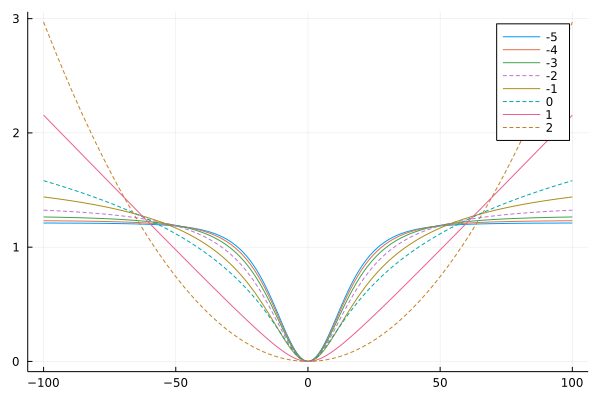

In [211]:
c = 10
α = -2

x = collect(-100 : 1 : 100)

pl = plot()
for α ∈ -5 : 1 : 2
    loss = calculate_loss_robust.(x, α=α, c=c)
    loss ./= mean(loss)
    linestyle = α ∈ (2, 0, -2) ? :dash : :solid
    plot!(pl, x, loss, label=α, linestyle=linestyle)
end

display(pl)

In [212]:
function calculate_rmse(x, y)
    se = (x .- y) .^2
    return √mean(se)
end

calculate_rmse (generic function with 1 method)

In [213]:
function prepare_p(x::Vector{Float64})
    
    @assert length(x) == length(p_keys_opt)
    
    p = deepcopy(p_dict)
    for (k, v, is_log) in zip(p_keys_opt, x, mask_log)
        p[k] = mask_log[k] ? exp(v) : v
#         p[k] = v

    end
    
    p["α"] = kwargs_loss_robust.α
    
    return p
    
end

prepare_p (generic function with 1 method)

In [214]:
function solve_model(p)
    
    # print(p)
    prob = ODEProblem(rhs, u₀, tspan, p, callback=cb_step_v1)
    solve_kwargs = (; reltol, abstol, solver, saveat)
    sol = solve(prob; solve_kwargs...)
    # println("full")

    return sol
end

solve_model (generic function with 1 method)

In [215]:
function calculate_loss(x)
    
    p = prepare_p(x)
    sol = solve_model(p)
    
    if sol.retcode ≠ :Success
        loss = Inf
    else
#         loss = calculate_rmse(sol[:I_out], data)
        residuals = sol[:I_out] - data
        loss = calculate_loss_robust.(residuals, α=p["α"], c=kwargs_loss_robust.c)
        loss = mean(loss)
    end
    
    # println(loss)
        
    return loss
    
end

calculate_loss (generic function with 1 method)

# Generate data

In [216]:
x₀ = [mask_log[k] ? log.(p_dict[k]) : p_dict[k] for k in p_keys_opt]

20-element Vector{Float64}:
 -2.0
  9.035081813382545
 18.0
  9.71287532289443
  2.55194984411125
  5.957649198613251
  3.12776879942174
  3.344909882583472
  2.0368954054310784
  1.8341801851120072
  3.073618812211062
 10.970461364771992
  2.3297945357086913
  4.089184103261701
  1.706160004112492
 -6.630123542383857
 -0.43664622559173916
  4.240131794288081
  9.337704913602511
  2.0075426661359725

In [217]:
p = prepare_p(x₀);

In [218]:
# p["tau_z"] = 0.001

In [219]:
sol = solve_model(p);

In [221]:
@benchmark solve_model(p)

BenchmarkTools.Trial: 18 samples with 1 evaluation.
 Range (min … max):  246.893 ms … 367.756 ms  ┊ GC (min … max): 12.68% … 13.83%
 Time  (median):     276.905 ms               ┊ GC (median):    12.21%
 Time  (mean ± σ):   288.943 ms ±  41.398 ms  ┊ GC (mean ± σ):  12.83% ±  2.24%

  ▁▁▁█  ▁▁  ▁   ▁▁▁  ▁     ▁    ▁              ▁          ▁   █  
  ████▁▁██▁▁█▁▁▁███▁▁█▁▁▁▁▁█▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁█▁▁▁█ ▁
  247 ms           Histogram: frequency by time          368 ms <

 Memory estimate: 200.73 MiB, allocs estimate: 2544089.

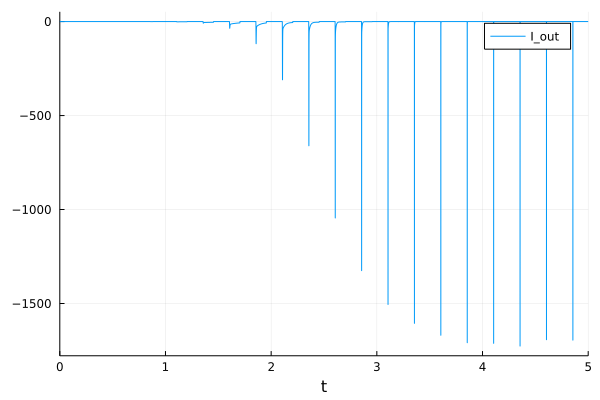

In [220]:
plot(sol, vars=[:I_out])
# plot!(xlims=(1.8, 1.9))

In [222]:
data = copy(sol[:I_out]);

In [223]:
calculate_loss(x₀)

0.0

# Optimize

In [224]:
using BlackBoxOptim

In [225]:
using PyCall
so = pyimport("scipy.optimize");

In [226]:
bounds = [minmax(x - 1, x + 1) for x in x₀]

20-element Vector{Tuple{Float64, Float64}}:
 (-3.0, -1.0)
 (8.035081813382545, 10.035081813382545)
 (17.0, 19.0)
 (8.71287532289443, 10.71287532289443)
 (1.5519498441112498, 3.55194984411125)
 (4.957649198613251, 6.957649198613251)
 (2.12776879942174, 4.12776879942174)
 (2.344909882583472, 4.344909882583472)
 (1.0368954054310784, 3.0368954054310784)
 (0.8341801851120072, 2.8341801851120074)
 (2.073618812211062, 4.073618812211063)
 (9.970461364771992, 11.970461364771992)
 (1.3297945357086913, 3.3297945357086913)
 (3.089184103261701, 5.089184103261701)
 (0.706160004112492, 2.7061600041124922)
 (-7.630123542383857, -5.630123542383857)
 (-1.4366462255917392, 0.5633537744082608)
 (3.2401317942880814, 5.240131794288081)
 (8.337704913602511, 10.337704913602511)
 (1.0075426661359725, 3.0075426661359725)

In [227]:
bounds[findfirst(p_keys_opt .== "α")] = (-5, 0)

(-5, 0)

In [228]:
lb = [b[1] for b in bounds]
ub = [b[2] for b in bounds];

In [229]:
x_initial = [b[1] + rand() * (b[2] - b[1]) for b in bounds];

In [230]:
res = bboptimize(calculate_loss; SearchRange=bounds, MaxTime=10 * 60., TraceInterval=10,
                 PopulationSize=100,
                 Method = :adaptive_de_rand_1_bin_radiuslimited,
                 );

Starting optimization with optimizer DiffEvoOpt{FitPopulation{Float64}, RadiusLimitedSelector, BlackBoxOptim.AdaptiveDiffEvoRandBin{3}, RandomBound{ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


10.02 secs, 44 evals, 23 steps, improv/step: 0.565 (last = 0.5652), fitness=0.392330388
20.20 secs, 80 evals, 43 steps, improv/step: 0.465 (last = 0.3500), fitness=0.385004411


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


30.50 secs, 115 evals, 64 steps, improv/step: 0.453 (last = 0.4286), fitness=0.376802582


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


40.72 secs, 150 evals, 86 steps, improv/step: 0.465 (last = 0.5000), fitness=0.376802582
51.10 secs, 182 evals, 106 steps, improv/step: 0.500 (last = 0.6500), fitness=0.376802582
61.33 secs, 216 evals, 126 steps, improv/step: 0.484 (last = 0.4000), fitness=0.376802582
71.78 secs, 256 evals, 152 steps, improv/step: 0.447 (last = 0.2692), fitness=0.376802582
82.07 secs, 296 evals, 180 steps, improv/step: 0.417 (last = 0.2500), fitness=0.376802582


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


92.08 secs, 332 evals, 205 steps, improv/step: 0.424 (last = 0.4800), fitness=0.376802582
102.54 secs, 367 evals, 230 steps, improv/step: 0.413 (last = 0.3200), fitness=0.376802582
112.82 secs, 403 evals, 254 steps, improv/step: 0.421 (last = 0.5000), fitness=0.376802582


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


123.00 secs, 439 evals, 282 steps, improv/step: 0.422 (last = 0.4286), fitness=0.376802582
133.12 secs, 474 evals, 311 steps, improv/step: 0.402 (last = 0.2069), fitness=0.376802582
143.14 secs, 513 evals, 341 steps, improv/step: 0.381 (last = 0.1667), fitness=0.376802582
153.16 secs, 547 evals, 367 steps, improv/step: 0.373 (last = 0.2692), fitness=0.376802582
163.30 secs, 587 evals, 401 steps, improv/step: 0.362 (last = 0.2353), fitness=0.376802582


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


173.51 secs, 628 evals, 437 steps, improv/step: 0.378 (last = 0.5556), fitness=0.376802582
183.65 secs, 666 evals, 472 steps, improv/step: 0.386 (last = 0.4857), fitness=0.376802582
194.14 secs, 700 evals, 501 steps, improv/step: 0.383 (last = 0.3448), fitness=0.366990847


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


204.32 secs, 735 evals, 531 steps, improv/step: 0.377 (last = 0.2667), fitness=0.366809564
214.54 secs, 772 evals, 564 steps, improv/step: 0.378 (last = 0.3939), fitness=0.366809564


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


224.81 secs, 811 evals, 602 steps, improv/step: 0.374 (last = 0.3158), fitness=0.366809564
234.81 secs, 843 evals, 630 steps, improv/step: 0.373 (last = 0.3571), fitness=0.363855898


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


244.85 secs, 874 evals, 659 steps, improv/step: 0.375 (last = 0.4138), fitness=0.363855898
254.85 secs, 908 evals, 692 steps, improv/step: 0.366 (last = 0.1818), fitness=0.363855898
264.91 secs, 945 evals, 727 steps, improv/step: 0.360 (last = 0.2571), fitness=0.363855898
275.28 secs, 985 evals, 763 steps, improv/step: 0.355 (last = 0.2500), fitness=0.363855898
285.56 secs, 1025 evals, 797 steps, improv/step: 0.355 (last = 0.3529), fitness=0.363855898
296.02 secs, 1064 evals, 832 steps, improv/step: 0.356 (last = 0.3714), fitness=0.336455003


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


306.21 secs, 1103 evals, 869 steps, improv/step: 0.349 (last = 0.1892), fitness=0.295328270
316.34 secs, 1143 evals, 909 steps, improv/step: 0.347 (last = 0.3000), fitness=0.295328270
326.43 secs, 1182 evals, 947 steps, improv/step: 0.342 (last = 0.2368), fitness=0.295328270
336.51 secs, 1220 evals, 983 steps, improv/step: 0.341 (last = 0.3056), fitness=0.295328270
346.66 secs, 1258 evals, 1021 steps, improv/step: 0.333 (last = 0.1316), fitness=0.295328270
356.74 secs, 1296 evals, 1057 steps, improv/step: 0.330 (last = 0.2500), fitness=0.295328270
366.77 secs, 1336 evals, 1096 steps, improv/step: 0.330 (last = 0.3333), fitness=0.295328270
377.08 secs, 1375 evals, 1135 steps, improv/step: 0.330 (last = 0.3077), fitness=0.295328270
387.28 secs, 1412 evals, 1170 steps, improv/step: 0.325 (last = 0.1714), fitness=0.295328270
397.45 secs, 1448 evals, 1204 steps, improv/step: 0.326 (last = 0.3824), fitness=0.295328270


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


407.47 secs, 1486 evals, 1241 steps, improv/step: 0.322 (last = 0.1622), fitness=0.295328270
417.65 secs, 1524 evals, 1275 steps, improv/step: 0.319 (last = 0.2353), fitness=0.295328270
427.89 secs, 1560 evals, 1309 steps, improv/step: 0.322 (last = 0.4118), fitness=0.295328270


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


438.11 secs, 1599 evals, 1347 steps, improv/step: 0.322 (last = 0.3421), fitness=0.295328270
448.22 secs, 1639 evals, 1386 steps, improv/step: 0.320 (last = 0.2564), fitness=0.295328270
458.28 secs, 1673 evals, 1420 steps, improv/step: 0.315 (last = 0.1176), fitness=0.295328270
468.42 secs, 1708 evals, 1455 steps, improv/step: 0.315 (last = 0.2857), fitness=0.295328270


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


478.61 secs, 1745 evals, 1491 steps, improv/step: 0.310 (last = 0.1111), fitness=0.295328270
488.63 secs, 1780 evals, 1525 steps, improv/step: 0.308 (last = 0.2059), fitness=0.295328270
498.64 secs, 1817 evals, 1562 steps, improv/step: 0.307 (last = 0.2703), fitness=0.295328270
508.68 secs, 1854 evals, 1599 steps, improv/step: 0.306 (last = 0.2973), fitness=0.295328270
518.80 secs, 1886 evals, 1631 steps, improv/step: 0.303 (last = 0.1250), fitness=0.295328270


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


528.94 secs, 1925 evals, 1670 steps, improv/step: 0.300 (last = 0.1795), fitness=0.295328270
539.09 secs, 1962 evals, 1707 steps, improv/step: 0.295 (last = 0.0541), fitness=0.295328270


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


549.14 secs, 1999 evals, 1742 steps, improv/step: 0.292 (last = 0.1714), fitness=0.295328270
559.24 secs, 2037 evals, 1779 steps, improv/step: 0.290 (last = 0.1892), fitness=0.295328270
569.49 secs, 2074 evals, 1816 steps, improv/step: 0.288 (last = 0.1892), fitness=0.295328270
579.68 secs, 2109 evals, 1851 steps, improv/step: 0.285 (last = 0.1429), fitness=0.295328270
589.86 secs, 2146 evals, 1887 steps, improv/step: 0.285 (last = 0.2500), fitness=0.295328270
599.87 secs, 2180 evals, 1921 steps, improv/step: 0.283 (last = 0.2059), fitness=0.295328270

Optimization stopped after 1922 steps and 600.16 seconds
Termination reason: Max time (600.0 s) reached
Steps per second = 3.20
Function evals per second = 3.63
Improvements/step = Inf
Total function evaluations = 2181


Best candidate found: [-4.38354, 9.60248, 18.724, 10.4293, 2.62785, 6.74692, 2.83942, 3.58769, 1.81575, 1.73052, 3.65445, 10.654, 2.12276, 4.27276, 1.86926, -5.6798, -0.566196, 5.17112, 9.70052, 2.08994]

Fitness: 0.2953

In [231]:
x_bbo = best_candidate(res);
x_best = copy(x_bbo);

In [232]:
res = so.minimize((x, args) -> calculate_loss(x), x_best, bounds,
                  method="Nelder-Mead", options=Dict(:maxiter => 1000))

Dict{Any, Any} with 8 entries:
  "fun"           => 0.173548
  "nit"           => 1000
  "nfev"          => 1390
  "status"        => 2
  "success"       => false
  "message"       => "Maximum number of iterations has been exceeded."
  "x"             => [-4.51271, 9.55962, 17.3745, 10.9574, 2.84319, 6.02348, 2.…
  "final_simplex" => ([-4.51271 9.55962 … 9.549 1.97223; -4.51265 9.5597 … 9.54…

In [233]:
x_best = res["x"]

20-element Vector{Float64}:
 -4.512711347877724
  9.559621949517002
 17.374456255998695
 10.957443748173535
  2.843191729969758
  6.023475675906389
  2.9688006351793437
  3.5873507425570614
  1.8516837190842457
  1.7135164422328053
  2.5133689101552976
 10.620267864973485
  2.3806311018723303
  4.274622665020505
  1.873383510295542
 -6.161177247054399
 -0.6015444953486035
  5.460836507721828
  9.54900245432979
  1.9722273180300092

In [234]:
# res = so.minimize((x, args) -> calculate_loss(x), x_best, bounds, method="Nelder-Mead", options=Dict(:maxiter => 1000))

In [235]:
df = DataFrame(Name = p_keys_opt,
          True = x₀,
          Lb = lb,
          Best = x_best,
          Ub = ub);
# df[:, 2:end] = exp.(df[:, 2:end]);
df.relerr = (df.Best - df.True) ./ df.Best * 100.;

In [236]:
df

,Name,True,Lb,Best,Ub,relerr
,String,Float64,Float64,Float64,Float64,Float64
1,α,-2.0,-5.0,-4.51271,0.0,55.6807
2,g_max,9.03508,8.03508,9.55962,10.0351,5.48704
3,v_rev,18.0,17.0,17.3745,19.0,-3.60036
4,a0_m,9.71288,8.71288,10.9574,10.7129,11.3582
5,s_m,2.55195,1.55195,2.84319,3.55195,10.2435
6,b0_m,5.95765,4.95765,6.02348,6.95765,1.09283
7,delta_m,3.12777,2.12777,2.9688,4.12777,-5.35463
8,v_half_m,3.34491,2.34491,3.58735,4.34491,6.75821
9,k_m,2.0369,1.0369,1.85168,3.0369,-10.0023


In [237]:
calculate_loss(x_bbo), calculate_loss(x_best)

(0.29532826951308877, 0.17354817330384045)

In [238]:
p_best = prepare_p(x_best)
sol_best = solve_model(p_best);

In [239]:
plot(sol_best, vars=[:I_out])
plot!(sol_best.t, data)
plot!(ylims=(-10, 10))

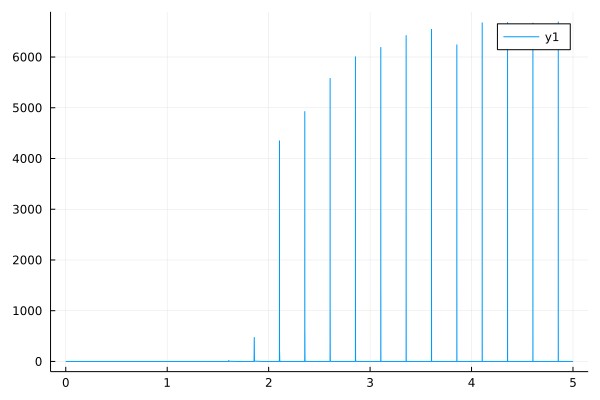

In [240]:
residuals = sol_best[:I_out] - data
plot(sol_best.t, abs.(residuals))

In [241]:
plot(sol_best.t, calculate_loss_robust.(residuals,
                                         c=0.1, #kwargs_loss_robust.c,
                                         α=-3, #p_best["α"]
                                        ))

plot!(sol_best.t, calculate_loss_robust.(residuals,
                                         c=kwargs_loss_robust.c,
                                         α=p_best["α"]
                                        ))